# Imports

We use the following libraries to fetch and parse html pages, and to interact with the Foursquare API.

In [1]:
from bs4 import BeautifulSoup
import requests
import requests_cache

# Request_cache caches all calls to wikipedia and foursquare so we only have to do it once.
requests_cache.install_cache('requests_cache')

We use regular expressions, e.g. to extract population count and city coordinates from scraped webpages

In [2]:
import re

We use Pandas for building the dataframe.

In [3]:
import pandas as pd

ast to parse a string to a dict

In [4]:
import ast

We use folium for creating maps

In [5]:
import folium
from folium import plugins

We use Shapely for checking if venues are really in a neighbourhood

In [6]:
from shapely.geometry import shape, Point

Matplotlib for graphs and color related functionality

In [7]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

We use NumPy and Scikit-learn for clustering

In [8]:
import math
import numpy as np
from sklearn.cluster import KMeans
from sklearn import tree
from sklearn import metrics

# The Eindhoven dataset

## Obtaining the dataset

Found some datasets on Eindhoven neighbourhoods on https://data.eindhoven.nl/explore/dataset/buurten/export/

In [9]:
# read csv file|
df_ehv = pd.read_csv('buurten.csv', sep=';')

## Cleaning up the dataset

In [10]:
# split latitude and longitude into separate columns
df_ehv[['Latitude', 'Longitude']] = df_ehv['geo_point_2d'].str.split(',', expand=True)
df_ehv[['Latitude', 'Longitude']] = df_ehv[['Latitude', 'Longitude']].apply(lambda x: x.str.strip()).astype(float)

# store the geometric shape
df_ehv['Geo_shape'] = df_ehv['geo_shape'].apply(lambda x: dict(ast.literal_eval(x)))

# drop uninteresting columns
df_ehv.drop(['SHAPE.AREA', 'SHAPE.LEN', 'Objectid ', 'geo_shape', 'geo_point_2d'], axis=1, inplace=True)

# rename change column names
df_ehv.columns = ['Buurtcode', 'Buurtnaam', 'Wijkcode', 'Wijknaam', 'Stadsdeelcode', 'Stadsdeelnaam', 'Latitude', 'Longitude', 'Geo_shape']

df_ehv.head()

,Buurtcode,Buurtnaam,Wijkcode,Wijknaam,Stadsdeelcode,Stadsdeelnaam,Latitude,Longitude,Geo_shape
0,240,Riel,23,Putten,2,Stratum,51.416701,5.521553,"{'type': 'Polygon', 'coordinates': [[[5.515769..."
1,632,Meerbos,63,Meerhoven,6,Strijp,51.450561,5.416852,"{'type': 'Polygon', 'coordinates': [[[5.410912..."
2,731,Genderbeemd,73,Gestelse Ontginning,7,Gestel,51.422574,5.438449,"{'type': 'Polygon', 'coordinates': [[[5.427909..."
3,231,Poeijers,23,Putten,2,Stratum,51.431234,5.518226,"{'type': 'Polygon', 'coordinates': [[[5.518753..."
4,512,Prinsejagt,51,Ontginning,5,Woensel-Noord,51.468302,5.458431,"{'type': 'Polygon', 'coordinates': [[[5.467129..."


## Exploring the dataset

We can see from this set how many neighbourhoods (buurten), residential areas (wijken) and boroughs (stadsdeel) the city of Eindhoven has:

In [11]:
print("Eindhoven has {} neighbourhoods (buurt) in {} residential areas (wijk), spread over {} boroughs (stadsdeel)".format(df_ehv.shape[0], len(df_ehv.groupby('Wijkcode')), len(df_ehv.groupby('Stadsdeelcode'))))

Eindhoven has 116 neighbourhoods (buurt) in 20 residential areas (wijk), spread over 7 boroughs (stadsdeel)


From initial exploration we know that Foursquare does not have enough information to do any useful information on Neighbourhood level.

## Putting Eindhoven on the map

To give an initial indication of how the various neighbourhoods look, we plot the shapes from a GeoJSON file containing exactly the same locations as in the table.
Later, we will add more to this map.

In [12]:
# create map of the world using latitude and longitude values
ehv_map = folium.Map(location=[51.4416, 5.4697],zoom_start=12)

fs = plugins.Fullscreen()
ehv_map.add_child(fs)

folium.GeoJson('buurten.geojson.json').add_to(ehv_map)

ehv_map

# Getting venue information from Foursquare

In this section we will ask Foursquare for the Top Picks venues in neighbourhood in the city of Eindhoven

## Setting up the connection

The following information is needed to connect with Foursquare API

In [13]:
CLIENT_ID = 'YPBVFDUZOP1M24BKCWGXIYZ3RFACOE3V35WSFY4DSCMRU44L' # your Foursquare ID
CLIENT_SECRET = 'VYHYTBSRIZBPYAOCP5ZEFV3YM4C40YEQCQWCUO4NC1JTPNJM' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

## Scraper function

We will ask Foursquare for the top picks in every neighbourhoods, then store its name, location and main category.

The following function takes series of Cities and their latituted and longitudes. It will then output a dataframe containing all these venues. 

We let foursquare choose the most relevant venues for each point, but we then filter on whether those venues are actually in that neighbourhood

In [14]:
MAX=200
LIMIT=50
RADIUS=2000

def getRecommendedVenues(neighbourhoods, nbcodes, latitudes, longitudes, polygons):
    
    venues_list=[]
    for nb, code, lat, lon, poly in zip(neighbourhoods, nbcodes, latitudes, longitudes, polygons):
            
        for offset in range(0,MAX,LIMIT):
            # create the API request URL
            url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&intent=browse&v={}&ll={},{}&limit={}&offset={}&radius={}'.format(
                CLIENT_ID, 
                CLIENT_SECRET, 
                VERSION, 
                lat,
                lon,
                LIMIT,
                offset,
                RADIUS)

            # make the GET request
            response = requests.get(url)
            if response.status_code == requests.codes.ok:
                results = response.json()["response"]['venues']
                if len(results)==0:
                    continue
            else:
                print ("status was:" + str(response.status_code))
                print ("could not scrape " + url)
                print (response)
                break

            # check if venue is actually in this neighbourhood
            polygon = shape(poly)
            for v in results:
                if len(v['categories']) != 0:
                    if len(v['categories']) > 1:
                        print(v['name'])
                    point = Point(v['location']['lng'],v['location']['lat'])
                    if polygon.contains(point):
                        venues_list.append([(
                            code,
                            v['name'], 
                            v['id'],
                            v['location']['lat'], 
                            v['location']['lng'],  
                            v['categories'][0]['name'])])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Buurtcode',
                  'Venue',
                  'Venue ID',
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

## Scraping from foursquare

Now we can run it on all the cities from our cities dataframe and store the found venues in a new dataframe.
This can take a while when running for the first time, and also fail a few times with a 504 error. 

But every request will be cached, which makes subsequent calls incredibly fast.

In [15]:
df_venues = getRecommendedVenues(df_ehv['Buurtnaam'], df_ehv['Buurtcode'], df_ehv['Latitude'], df_ehv['Longitude'], df_ehv['Geo_shape'])
print ("Found {} venues for {} different neighbourhoods".format(df_venues.shape[0], len(df_venues.groupby('Buurtcode'))))
df_venues.head()

Found 12522 venues for 116 different neighbourhoods


,Buurtcode,Venue,Venue ID,Venue Latitude,Venue Longitude,Venue Category
0,240,Random Veld Eindhoven,57190012498ebfa7c0bc536b,51.415874,5.524489,Other Great Outdoors
1,240,wirowok st wirostraat eindhoven,4e1c6999a80980ebf5a18737,51.416636,5.518441,Asian Restaurant
2,240,Stal De Groof,4db971516e818f67a9be8786,51.419093,5.523564,Farm
3,240,Fietsknooppunt 27 (Noord Brabant),4eccbada6c25f61c322446eb,51.418031,5.518135,Bike Trail
4,240,Riel,4b5afa01f964a52013dd28e3,51.424553,5.522202,Scenic Lookout


## Putting venues on the map

Putting all venues on a map is a stretch for Jupyter, so it may not actually display.  
Fortunately we can export the map as HTML and open it separately.

In [16]:
# create map of the world using latitude and longitude values
ehv_venues_map = folium.Map(location=[51.4416, 5.4697],zoom_start=12, prefer_canvas=True )

# create a full screen button
fs = plugins.Fullscreen()
ehv_venues_map.add_child(fs)


folium.GeoJson('buurten.geojson.json').add_to(ehv_venues_map)

# add markers to map for every venue
for lat, lng, venue, cat in zip(df_venues['Venue Latitude'], df_venues['Venue Longitude'], df_venues['Venue'], df_venues['Venue Category']):
    label = '{}: {}'.format(venue, cat)
    label = folium.Popup(label)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
    ).add_to(ehv_venues_map)  
    
# save the map to interactive html, then display
ehv_venues_map.save('ehv_venues_map.html')
ehv_venues_map

# Clustering neighbourhoods

## Counting venue categories

Just as in the lectures, we want to find out what the types of venues are for each neighbourhood.

We do this by first turning the venue categories in one-hot notations, and then averaging these numbers for every neighbourhood.
This automatically takes care of having different amounts of venues for different neighbourhoods.

In [17]:
# one hot encoding of venue category
df_venues_onehot = pd.get_dummies(df_venues[['Venue Category']], prefix="", prefix_sep="")

# add city and nation columns back to the dataframe
df_venues_onehot['Buurtcode'] = df_venues['Buurtcode']

# move those column to the first column
fixed_columns = list(df_venues_onehot.columns[-1:]) + list(df_venues_onehot.columns[:-1])
df_venues_onehot = df_venues_onehot[fixed_columns]

df_venues_onehot.head()

,Buurtcode,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Service,Airport Terminal,Alternative Healer,...,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo Exhibit
0,240,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,240,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,240,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,240,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,240,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Most common venue categories per city

In [18]:
df_venues_grouped = df_venues_onehot.groupby(['Buurtcode']).sum().reset_index()

In [19]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[2:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

In [20]:
num_top_venues = 5

# create columns according to number of top venues
columns = ['Buurtcode']
for ind in np.arange(num_top_venues):
    columns.append('Common Venue {}'.format(ind+1))

# create a new dataframe
df_common_venues = pd.DataFrame(columns=columns)
df_common_venues['Buurtcode'] = df_venues_grouped['Buurtcode']

# actually perform counting
for ind in np.arange(df_venues_grouped.shape[0]):
    df_common_venues.iloc[ind, 1:] = return_most_common_venues(df_venues_grouped.iloc[ind, :], num_top_venues)

In [21]:
df_common_venues.head()

,Buurtcode,Common Venue 1,Common Venue 2,Common Venue 3,Common Venue 4,Common Venue 5
0,111,Clothing Store,Women's Store,Men's Store,Electronics Store,Restaurant
1,112,Salon / Barbershop,Asian Restaurant,Bakery,Sushi Restaurant,Flower Shop
2,113,Hotel,Office,Parking,Building,Residential Building (Apartment / Condo)
3,114,Bus Line,Hotel,Restaurant,Noodle House,Other Event
4,115,College Lab,Bar,University,College Academic Building,College Classroom


## Finding similar neighbourhoods

For clustering, we use the averages for every category as found in section 3, but drop the buurtcode attributes

In [121]:
df_clustering = df_venues_onehot.groupby(['Buurtcode']).sum().reset_index().drop(['Buurtcode'],1)
df_clustering = df_clustering.div(df_clustering.sum(axis=1), axis=0)
df_clustering.head()

,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Service,Airport Terminal,Alternative Healer,American Restaurant,...,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo Exhibit
0,0.0,0.02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.06,0.0,0.0
1,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
2,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
3,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0
4,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0


### Finding optimal value for $k$

We look at a silhouette score for various values of k to find an optimal one.

A first look immediately finds that 2,3,4 give better values, but I find that too few clusters.

maximum is 0.19598050031257064, which occurs at k=2


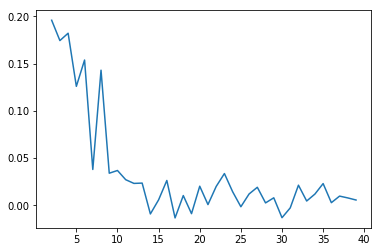

In [122]:
START = 2
END = 40
scores = []
for k in range(START, END):
    # run k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=0).fit(df_clustering)
    
    scores.append(metrics.silhouette_score(df_clustering, kmeans.labels_))   
print( "maximum is {}, which occurs at k={}".format(np.max(scores),np.argmax(scores)+START))
kclusters=np.argmax(scores)+START
plt.plot(range(START,END),scores)

### Clustering

We use Scikit-learn for kmeans clustering, with $k=\mathrm{kclusters}$ clusters.

In [123]:
kclusters=4
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(df_clustering)

We add these labels to the cities dataframe, as well as the most common venues found in the previous section.

We save the result as a new dataframe cities2

In [124]:
df_common_venues['Cluster label'] = kmeans.labels_

df_ehv_clusters = pd.merge( df_ehv, df_common_venues, how='left',
        on=['Buurtcode'])
df_ehv_clusters.head()

,Buurtcode,Buurtnaam,Wijkcode,Wijknaam,Stadsdeelcode,Stadsdeelnaam,Latitude,Longitude,Geo_shape,Common Venue 1,Common Venue 2,Common Venue 3,Common Venue 4,Common Venue 5,Cluster label
0,240,Riel,23,Putten,2,Stratum,51.416701,5.521553,"{'type': 'Polygon', 'coordinates': [[[5.515769...",Scenic Lookout,Nature Preserve,Farm,Other Great Outdoors,Asian Restaurant,3
1,632,Meerbos,63,Meerhoven,6,Strijp,51.450561,5.416852,"{'type': 'Polygon', 'coordinates': [[[5.410912...",Breakfast Spot,Science Museum,Field,Hotel,Dutch Restaurant,1
2,731,Genderbeemd,73,Gestelse Ontginning,7,Gestel,51.422574,5.438449,"{'type': 'Polygon', 'coordinates': [[[5.427909...",Hookah Bar,Medical Center,Park,Assisted Living,Event Space,1
3,231,Poeijers,23,Putten,2,Stratum,51.431234,5.518226,"{'type': 'Polygon', 'coordinates': [[[5.518753...",Factory,Office,Automotive Shop,General Entertainment,Building,4
4,512,Prinsejagt,51,Ontginning,5,Woensel-Noord,51.468302,5.458431,"{'type': 'Polygon', 'coordinates': [[[5.467129...",Salon / Barbershop,Residential Building (Apartment / Condo),Coworking Space,Outdoors & Recreation,Supermarket,1


## Putting the clusters on a map

Create a color table for these clusters

In [125]:
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

Now actually put the cities on the map with a color depending on their cluster.

In [126]:
# create map of the world using latitude and longitude values
ehv_clusters_map = folium.Map(location=[51.4416, 5.4697],zoom_start=12, prefer_canvas=True )

# create a full screen button
fs = plugins.Fullscreen()
ehv_clusters_map.add_child(fs)

folium.GeoJson('buurten.geojson.json').add_to(ehv_clusters_map)

# add markers to map for every neighbourhood
for lat, lng, buurt, cluster in zip(df_ehv_clusters['Latitude'], df_ehv_clusters['Longitude'], df_ehv_clusters['Buurtnaam'], df_ehv_clusters['Cluster label']):
    label = "{}, ({},{})".format(buurt,lat,lng)
    label = folium.Popup(label)
    folium.CircleMarker(
        [lat, lng],
        popup=label,
        color=rainbow[cluster-1],
        fill=True
    ).add_to(ehv_clusters_map)  
    
# save the map to interactive html, then display
ehv_clusters_map.save('ehv_clusters.html')
ehv_clusters_map

# Examining the clusters

In [127]:
clusters = pd.DataFrame(df_ehv_clusters.groupby('Cluster label').apply(lambda x: ", ".join(x['Buurtnaam'].tolist())), columns=['Similar'])
clusters['Count'] = df_ehv_clusters.groupby('Cluster label')['Buurtcode'].count()
clusters

,Similar,Count
Cluster label,,
0,"Bosrijk, Vredeoord, Castiliëlaan, Eikenburg",4
1,"Meerbos, Genderbeemd, Prinsejagt, Lievendaal, ...",82
2,Eckartdal,1
3,"Riel, Sintenbuurt, Achtse Barrier-Spaaihoef, K...",11
4,"Poeijers, Mispelhoef, Hurk, Strijp S, Kapelbee...",11
5,Waterrijk,1
6,Luytelaer,1
7,"Gennep, Bokt, Herdgang, Hondsheuvels, Fellenoord",5
